In [7]:
import os
import gzip
import idx2numpy
dataset_dir = os.path.join(os.getcwd(), '..', 'dataset')
mnist_raw_dir = os.path.join(dataset_dir, 'MNIST', 'raw')
train_images = idx2numpy.convert_from_file(gzip.open(os.path.join(mnist_raw_dir, 'train-images-idx3-ubyte.gz')))
train_labels = idx2numpy.convert_from_file(gzip.open(os.path.join(mnist_raw_dir, 'train-labels-idx1-ubyte.gz')))
    
print(type(train_images))
print(train_images.shape)
print(train_labels.shape)

<class 'numpy.ndarray'>
(60000, 28, 28)
(60000,)


In [8]:
import umap
import matplotlib.pyplot as plt
# import seaborn as sns
import pandas as pd
import numpy as np
%matplotlib inline

e:\ProgramFiles\miniconda3\envs\geo\Lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
e:\ProgramFiles\miniconda3\envs\geo\Lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
e:\ProgramFiles\miniconda3\envs\geo\Lib\site-packages\umap\distances.py:1086: NumbaDepreca

In [12]:
num = 10000
mnist_data = mnist['data'].values[:num]

NameError: name 'mnist' is not defined

In [10]:
fig, ax_array = plt.subplots(5, 5)
axes = ax_array.flatten()
for i, ax in enumerate(axes):
    ax.imshow(mnist_data.reshape((-1, 28, 28))[i], cmap='gray_r')
plt.setp(axes, xticks=[], yticks=[], frame_on=False)
plt.tight_layout(h_pad=0.5, w_pad=0.01)

In [11]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(mnist_data)

NameError: name 'mnist_data' is not defined

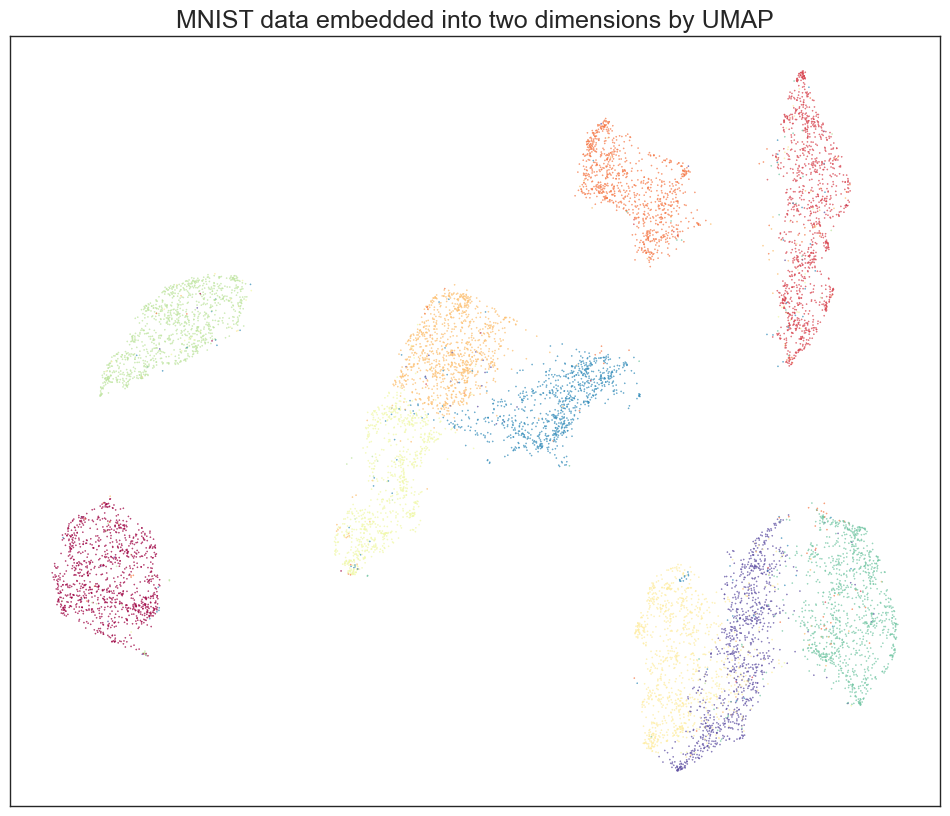

In [8]:
fig, ax = plt.subplots(figsize=(12, 10))
color = mnist.target.astype(int)[:num]
plt.scatter(embedding[:, 0], embedding[:, 1], c=color, cmap="Spectral", s=0.1)
plt.setp(ax, xticks=[], yticks=[])
plt.title("MNIST data embedded into two dimensions by UMAP", fontsize=18)

plt.show()

In [9]:
from io import BytesIO
from PIL import Image
import base64

In [10]:
def embeddable_image(data):
    img_data = 255 - 15 * data.astype(np.uint8)
    image = Image.fromarray(img_data, mode='L').resize((64, 64), Image.Resampling.BICUBIC)
    buffer = BytesIO()
    image.save(buffer, format='png')
    for_encoding = buffer.getvalue()
    return 'data:image/png;base64,' + base64.b64encode(for_encoding).decode()

In [11]:
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper
from bokeh.palettes import Spectral10

output_notebook()

Loading BokehJS ...

In [12]:
mnist_df = pd.DataFrame(embedding, columns=["x", "y"])
len(list(mnist.target.astype(int).values))

70000

In [16]:
mnist_df = pd.DataFrame(embedding, columns=["x", "y"])
mnist_df["digit"] = [str(x) for x in mnist.target.astype(int).values[:num]]
mnist_df["image"] = list(map(embeddable_image, mnist_data.reshape((-1, 28, 28))))


In [20]:
type(datasource)

bokeh.models.sources.ColumnDataSource

In [22]:
datasource = ColumnDataSource(mnist_df)
color_mapping = CategoricalColorMapper(
    factors=[str(i) for i in range(10)], palette=Spectral10
)

plot_figure = figure(
    title="MNIST data embedded into two dimensions by UMAP",
    tools=("pan, wheel_zoom, reset"),
)

plot_figure.add_tools(
    HoverTool(
        tooltips="""
<div>
    <div>
        <img src='@image' style='float: left; margin: 1px 1px 1px 1px'/>
    </div>
    <div>
        <span style='font-size: 16px; color: #224499'>Digit:</span>
        <span style='font-size: 18px'>@digit</span>
    </div>
</div>
"""
    )
)

plot_figure.circle(
    "x",
    "y",
    source=datasource,
    color=dict(field="digit", transform=color_mapping),
    line_alpha=0.6,
    fill_alpha=0.6,
    size=4,
)
show(plot_figure)
#为啥不显示？？

In [ ]:
digits_df = pd.DataFrame(embedding, columns=('x', 'y'))
digits_df['digit'] = [str(x) for x in digits.target]
digits_df['image'] = list(map(embeddable_image, digits.images))

datasource = ColumnDataSource(digits_df)
color_mapping = CategoricalColorMapper(factors=[str(9 - x) for x in digits.target_names],
                                       palette=Spectral10)

plot_figure = figure(
    title='UMAP projection of the Digits dataset',
    # plot_width=600,
    # plot_height=600,
    tools=('pan, wheel_zoom, reset')
)

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@image' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 16px; color: #224499'>Digit:</span>
        <span style='font-size: 18px'>@digit</span>
    </div>
</div>
"""))

plot_figure.circle(
    'x',
    'y',
    source=datasource,
    color=dict(field='digit', transform=color_mapping),
    line_alpha=0.6,
    fill_alpha=0.6,
    size=4
)
show(plot_figure)

### FashionMnist

In [ ]:
import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
import umap

In [24]:
import torch
import torchvision as tv
import os

In [26]:
dataset_dir = os.path.join(os.getcwd(), '..', 'dataset')
mnist_train = tv.datasets.MNIST(root=dataset_dir, train=True, download=False, transform=tv.transforms.ToTensor())

RuntimeError: Dataset not found. You can use download=True to download it